---
## Загрузка библиотек и модулей

---

In [1]:
using SciMLBase

using DiffEqCallbacks
using DifferentialEquations

using StaticArrays

using Plots

using Latexify
using LaTeXStrings

In [2]:
include("Utils\\Visualization_Utils.jl"); using .Visualization_Utils
include("Utils\\Computation_Utils.jl"); using .Computation_Utils
include("Utils\\CallBack_Utils.jl"); using .CallBack_Utils
include("ODEs\\BS_ODE.jl"); using .BS_ODE
include("ODEs\\BS_Transformed_ODE.jl"); using .BS_Transformed_ODE
include(raw"Utils\Bifurcation_Utils.jl")

---

## Система

---

### Параметры системы

In [3]:
K = 0.4 #K = 0.43
r = 0.1 #r = 0.11
a2 = pi / 2.0 #a4 = 3.24685
a4 = pi
Eps = 0.1
β = pi/2 + 1e-3

P_Bick = (K = K, r = r, a2 = a2, a4 = a4, Eps = Eps, β = β)

A, B, C = bick2abc(P_Bick)
P_abc = (A = A, B = B, C = C, Eps = Eps, β = β)

(A = -0.4, B = -0.4, C = -1.2246467991473532e-16, Eps = 0.1, β = 1.5717963267948964)

### Правая часть

In [4]:
# Исходная система до преобразования
Duo_1 = Get_Fast_BS(Sin_Couple)

# Система после логарифмического преобращования
Duo_2 = Get_Fast_BS_F()

(::Main.BS_Transformed_ODE.var"#BS_ODE_Duo_Fast#4"{Main.BS_Transformed_ODE.var"#Couple#3", Main.BS_Transformed_ODE.var"#Population_Rhs#2"{Main.BS_Transformed_ODE.var"#Unit_Rhs#1"}}) (generic function with 2 methods)

---

## Численное интегрирование

---

In [10]:
## Integration time ##
    time_span = 1000.0
    trans_time = 100000.0

## Initial condition ##
    #val = 0.1
    ic = SA[0.02, pi - 0.2, pi - 0.3, pi - 0.4, pi - 0.5, 0.01]
    #ic = [0.1, 1.2, 3.1, 2.2, 0.8, 2.8]

    #ic = SVector{6}(ic .+ [abs(r)/100 for r in randn(6)] .% pi)
    #ic = ic .+ [r/10 for r in randn(6)]
    #ic_sngl = SVector{3}(ic[1:3] .+ [r/50 for r in randn(3)])
    
    ic_1 = SVector{6}([ic[1:3]; Phi2Z.(ic[1:3])])

## Numerical parameters ##
    #alg = DP8()
    alg = RK4()
    #alg = AutoVern9(Rodas4())
    #alg = TRBDF2(autodiff=false)
    #alg = Vern9()
    abstol = 1e-6
    reltol = 1e-6
    dtmax = 1e-1
    dtmin = 1e-20
    maxiters = 1e10
    saveat = 0.1

    kwargs = Dict(:dtmax => dtmax, :dtmin => dtmin, :abstol => abstol, :reltol => reltol, :maxiters => maxiters, :saveat => saveat);
    diffeq = (dtmax = dtmax, dtmin = dtmin, Ttr = trans_time, alg = alg, abstol = abstol, reltol = reltol, maxiters = maxiters)

## Callback function ##
    callback(u, t, integrator) = cos((u[1] + 3pi/4.0)/2.0)

callback (generic function with 1 method)

In [11]:
ic = SA[  3.521793060633561
-3.672631369572926
-3.9610473751593673
 1.7522938030855033
-5.767907042997395
 2.1177439994225145]

 P_abc = (A = -0.0605,
    B = -0.06740280698747875,
    C = 0.0,
    Eps = 0.104)

(A = -0.0605, B = -0.06740280698747875, C = 0.0, Eps = 0.104)

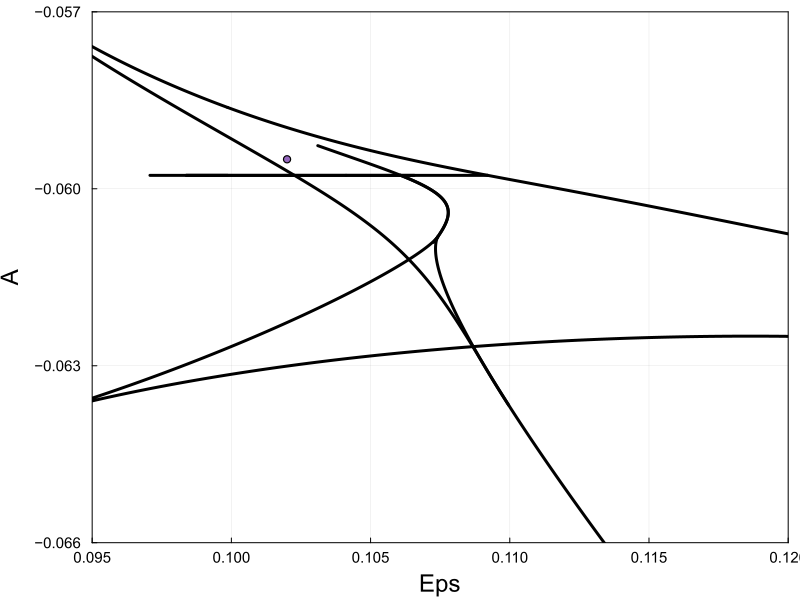

In [175]:
bifcurves(md, Pair("Eps", "A"), color = "black", size = (800, 600), xlims = (0.095, 0.12), ylims = (-0.066, -0.057))
scatter!([P_abc[4]], [P_abc[1]])

In [12]:
@time trj = SolveODE(Duo_2, ic, time_span; alg, p = P_abc, trans_time, kwargs)
sol = trj.solution; trj

  5.999375 seconds (54.54 M allocations: 4.315 GiB, 15.82% gc time)


[ODE::Main.BS_Transformed_ODE.var"#BS_ODE_Duo_Fast#4"{Main.BS_Transformed_ODE.var"#Couple#3", Main.BS_Transformed_ODE.var"#Population_Rhs#2"{Main.BS_Transformed_ODE.var"#Unit_Rhs#1"}}]: BS_ODE_Duo_Fast
[solution::py_sol{Main.BS_Transformed_ODE.var"#BS_ODE_Duo_Fast#4"{Main.BS_Transformed_ODE.var"#Couple#3", Main.BS_Transformed_ODE.var"#Population_Rhs#2"{Main.BS_Transformed_ODE.var"#Unit_Rhs#1"}}}]: [t]: 10001-element Vector{Float64}
[y]: 6-element Vector{Vector{Float64}} with size 10001
[t_events]: 1-element Vector{Vector{Float64}} with size 0
[y_events]: 1-element Vector{Matrix{Float64}} with size 0x0
[retcode]: Success

[p::NamedTuple{(:A, :B, :C, :Eps), NTuple{4, Float64}}]: (A = -0.0605, B = -0.06740280698747875, C = 0.0, Eps = 0.104)
[alg::RK4{typeof(OrdinaryDiffEq.trivial_limiter!), typeof(OrdinaryDiffEq.trivial_limiter!), Static.False}]: RK4(stage_limiter! = trivial_limiter!, step_limiter! = trivial_limiter!, thread = static(false))
[kwargs::Dict{Symbol, Any}]: Dict{Symbol, Any}(

### Временные диаграммы, проекции и диаграммы активации

In [8]:
var_labels = [["\\phi_$i" for i in 1:3]; ["\\psi_$i" for i in 1:3]]

var_labels_t = [["z_$i" for i in 1:3]; ["w_$i" for i in 1:3]]

proj_func = identity
#proj_func = Z2Phi
#proj_func = projCos

var_pairs = [(1, 4) (1, 5) (1, 6);
            (2, 4) (2, 5) (2, 6);
            (3, 4) (3, 5) (3, 6)]

h = Plots.h
w = Plots.w
l = @layout [
    [a{0.7h}
    b{0.3h}] c]

1×2 Matrix{Any}:
 Any[(label = :a, width = :auto, height = 0.7); (label = :b, width = :auto, height = 0.3);;]  …  (label = :c, blank = false)

In [13]:
ts = timeseries(sol, var_labels = var_labels_t, proj_func = proj_func)
p = poincare(sol, var_pairs, enable_events = false, var_labels = var_labels_t, proj_func = proj_func)
ad = activationdiagram(sol, var_labels = var_labels_t, thickness_scaling = 2, proj_func = proj_func, color_eps = 0.9
)#, color_eps = 0.9

bp = plot(ts, ad, p, layout = l, size = (1600, 1000), plot_titlevspan = 0.04, formatter = :plain, plot_title = "Transformed system with I(x) = sin(x)/2, $(repr(P_abc, context=:compact => true))")

#### "Хорошие" начальные условия и параметры

In [28]:

ic = SA[0.4989578382987649
-3.1025270496855617
 2.4506310684223673
-0.11285112729886235
-0.9849989167310211
-3.6702933861953615]

P_abc = (A = -0.06,
    B = -0.06,
    C = 0.0,
    Eps = 0.101)

P_abc = (A = -0.06,
    B = -0.06 * 1.12,
    C = 0.0,
    Eps = 0.105)

(A = -0.06, B = -0.06720000000000001, C = 0.0, Eps = 0.105)

---

## График векторного поля на гранях "кубика"

---

In [59]:
meshgrid(x, y) = (repeat(x, outer=length(y)), repeat(y, inner=length(x)))

function quiver_proj(f, step = pi/12, scale = 0.5)
    x, y = meshgrid(0:step:(pi + step), 0:step:(pi + step))

    #x, y = meshgrid(-10:1:10, -10:1:10)
    
    u = scale .* [i[1] for i in f.(x, y)]
    v = scale .* [i[2] for i in f.(x, y)]

    c = abs.(u .* v)
    p = quiver(x, y, quiver=(u, v), line_z=repeat(c, inner=4), size = (600, 600), legend = false, colorbar = :none, xticks = getTrigTikspi(), yticks = getTrigTikspi())#
    hline!([pi], ls = :dash, color = :black, lw = 2.0)
    vline!([pi], ls = :dash, color = :black, lw = 2.0)

    return p
end

function quiver_proj_2(ODE, P; kwargs...)
    return plot(
            plot(quiver_proj((x, y) -> ODE([x, y, 0.0, 0.0, 0.0, 0.0], P)[[1, 2]]), xguide = L"\phi_1", yguide = L"\phi_2"),
            plot(quiver_proj((x, y) -> ODE([x, 0.0, y, 0.0, 0.0, 0.0], P)[[1, 3]]), xguide = L"\phi_1", yguide = L"\phi_3"),
            plot(quiver_proj((x, y) -> ODE([0.0, x, y, 0.0, 0.0, 0.0], P)[[2, 3]]), xguide = L"\phi_2", yguide = L"\phi_3"),

            plot(quiver_proj((x, y) -> ODE([x, 0.0, 0.0, y, 0.0, 0.0], P)[[1, 4]]), xguide = L"\phi_1", yguide = L"\psi_1"),
            plot(quiver_proj((x, y) -> ODE([x, 0.0, 0.0, 0.0, y, 0.0], P)[[1, 5]]), xguide = L"\phi_1", yguide = L"\psi_2"),
            plot(quiver_proj((x, y) -> ODE([x, 0.0, 0.0, 0.0, 0.0, y], P)[[1, 6]]), xguide = L"\phi_1", yguide = L"\psi_3"),

            #plot(quiver_proj((x, y) -> ODE([0.0, x, 0.0, y, 0.0, 0.0], P)[[2, 4]]), xguide = L"\phi_2", yguide = L"\psi_1"),
            #plot(quiver_proj((x, y) -> ODE([0.0, x, 0.0, 0.0, y, 0.0], P)[[2, 5]]), xguide = L"\phi_2", yguide = L"\psi_2"),
            #plot(quiver_proj((x, y) -> ODE([0.0, x, 0.0, 0.0, 0.0, y], P)[[2, 6]]), xguide = L"\phi_2", yguide = L"\psi_3"),

            #plot(quiver_proj((x, y) -> ODE([0.0, 0.0, x, y, 0.0, 0.0], P)[[3, 4]]), xguide = L"\phi_3", yguide = L"\psi_1"),
            #plot(quiver_proj((x, y) -> ODE([0.0, 0.0, x, 0.0, y, 0.0], P)[[3, 5]]), xguide = L"\phi_3", yguide = L"\psi_2"),
            #plot(quiver_proj((x, y) -> ODE([0.0, 0.0, x, 0.0, 0.0, y], P)[[3, 6]]), xguide = L"\phi_3", yguide = L"\psi_3"),
            size = (1200, 800), margin = (5.0, :mm), layout = (2, 3); kwargs...
            )
end

quiver_proj_2 (generic function with 2 methods)

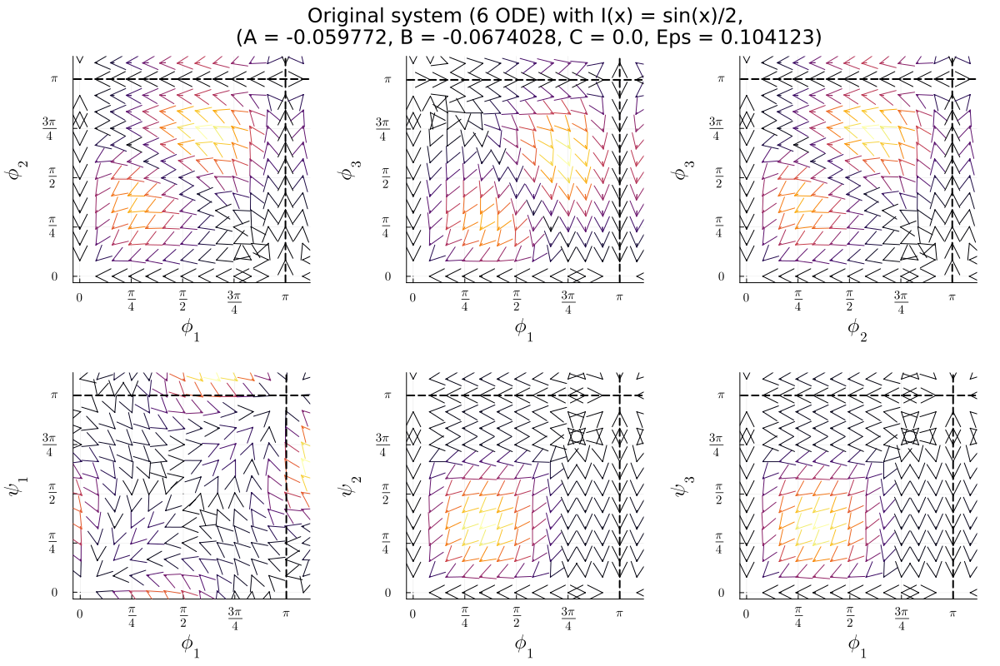

In [68]:
quiver_proj_2(Get_Fast_BS(Sin_Couple), P; plot_title = "Original system (6 ODE) with I(x) = sin(x)/2,\n $(repr(P, context=:compact => true))")

#### "Хорошие" начальные условия и параметры

In [68]:
Duo_2 = Get_Fast_BS_F()

ic = SA[  3.521793060633561
-3.672631369572926
-3.9610473751593673
 1.7522938030855033
-5.767907042997395
 2.1177439994225145]

#ic = SA[-2.5 4.4 -0.3 -0.1 -4.5 2.3]

P = (A = -0.05977203237457928,
    B = -0.06740280698747875,
    C = 0.0,
    Eps = 0.10412315329959422)

    P = [-0.061,
    -0.06740280698747875,
    0.0,
    0.105]

4-element Vector{Float64}:
 -0.061
 -0.06740280698747875
  0.0
  0.105

---

## Бифуркационные кривые из Матконта

---

In [10]:
md = MatcontData("matcont_data")

MatcontData(MatcontCurve[MatcontCurve([3.5217930541225875 3.521925925562598 … 3.9239585526873575 3.9243059424825764; -3.672111953233036 -3.6723308716268184 … -4.871030135939884 -4.872978722427839; … ; 203.55262580985345 203.55876452052976 … 248.58814428449693 248.67040940736376; 0.10411966251181297 0.1041179888827162 … 0.09838687714992365 0.09838086046921277], Dict{String, Any}("label" => Any["00"; "NS "; "99";;], "internallabel" => Any[Matrix{Float64}(undef, 0, 0); Matrix{Float64}(undef, 0, 0); Matrix{Float64}(undef, 0, 0);;], "msg" => Any["This is the first point of the curve"; "Neimark Sacker"; "This is the last point on the curve";;], "data" => Any[Dict{String, Any}("timemesh" => [0.0 0.03225681690519989 … 0.9726737034677198 1.0], "T" => 203.55262580985345, "ncol" => 4.0, "ntst" => 40.0, "phi" => [0.40824829046386296 0.40824829046386296 … 0.40824829046386296 0.40824829046386296], "multipliers" => ComplexF64[7.934764757484228e-12 + 0.0im; 1.658002501797894e-9 + 0.0im; … ; -0.1416913

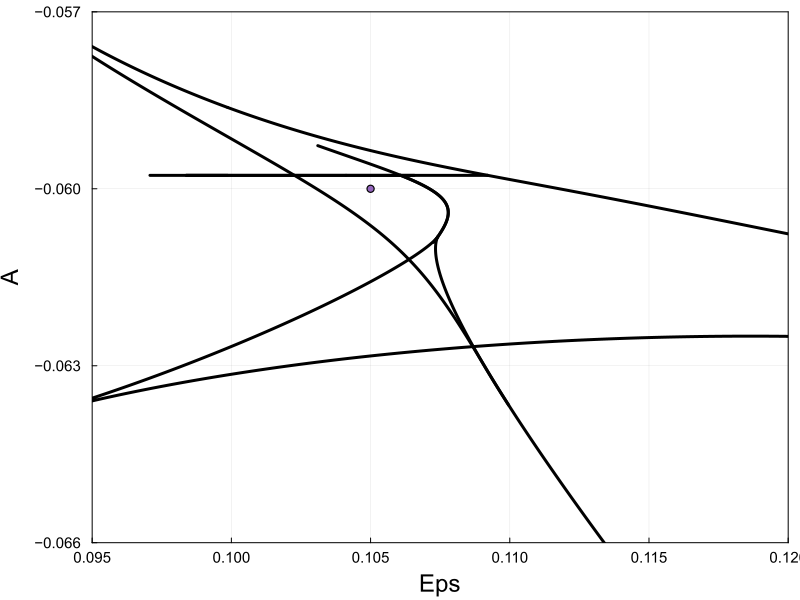

In [26]:
bifcurves(md, Pair("Eps", "A"), color = "black", size = (800, 600), xlims = (0.095, 0.12), ylims = (-0.066, -0.057))
scatter!([P_abc[4]], [P_abc[1]])

---

## Вычисление периода траекторий

---

In [86]:
max_ind_2 = round(Int, length(sol.t)/2)
for i in round(Int, length(sol.t)/2) : length(sol.t)
    if sol.y[2][i] > sol.y[2][max_ind_2]
        max_ind_2 = i
    end
end

In [89]:
period = sol.t[max_ind_2] - sol.t[max_ind_1]

203.60000000000014

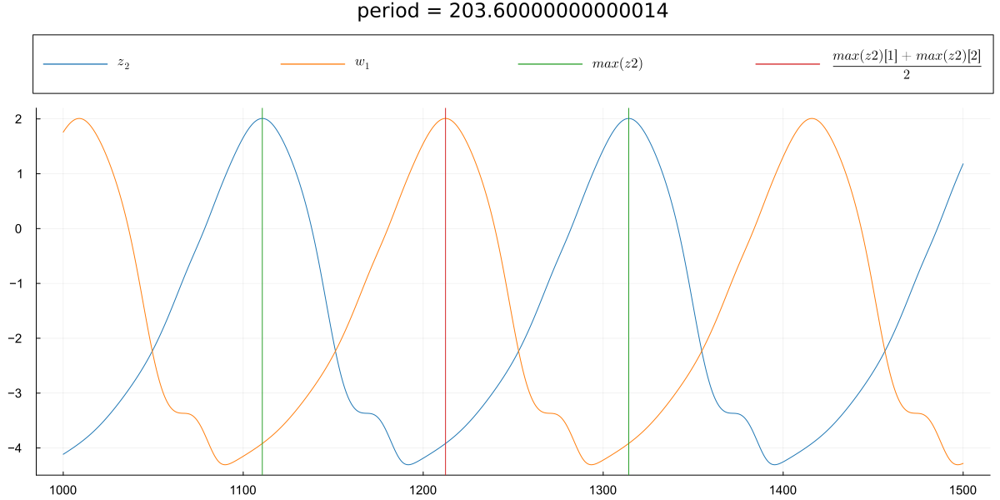

In [108]:
plot(sol.t, sol.y[2], lab = L"z_2")
plot!(sol.t, sol.y[4], lab = L"w_1")
vline!([sol.t[max_ind_1], sol.t[max_ind_2]], lab = L"max(z2)")
vline!([(sol.t[max_ind_1] + sol.t[max_ind_2]) / 2.0], lab = L"\frac{max(z2)[1] + max(z2)[2]}{2}", size = (1200, 600), legend = (:outertop), legend_column = -1, legend_size = 2.0, legendfontsize = 11, plot_title = "period = $period")

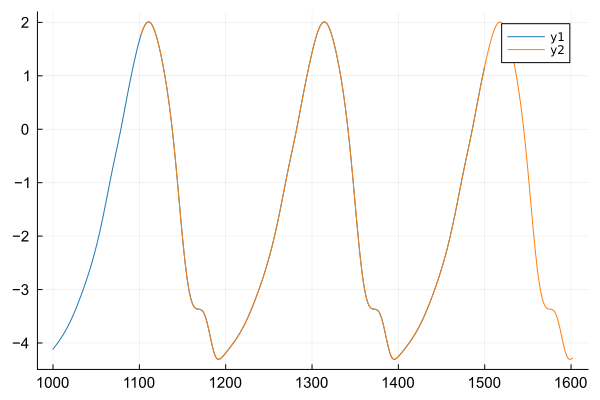

In [92]:
plot(sol.t, sol.y[2])
plot!(sol.t .+ period/2, sol.y[4])

---

## Поиск "интересных решений, при помощи рандома

---

#####  Условие остановки интегрирования при пересечении траекторией максимального значения

In [114]:
border = 15.0
condition(u, t, integrator) = any(x -> (x < -border || x > border), u) - 0.5
affect!(integrator) = terminate!(integrator)
cb = ContinuousCallback(condition, affect!)

ContinuousCallback{typeof(condition), typeof(affect!), typeof(affect!), typeof(SciMLBase.INITIALIZE_DEFAULT), typeof(SciMLBase.FINALIZE_DEFAULT), Float64, Int64, Rational{Int64}, Nothing, Int64}(condition, affect!, affect!, SciMLBase.INITIALIZE_DEFAULT, SciMLBase.FINALIZE_DEFAULT, nothing, SciMLBase.LeftRootFind, 10, Bool[1, 1], 1, 2.220446049250313e-15, 0, 1//100)

##### Функции генерирующие случайные параметры и начальные условия

In [73]:
function gen_AB()
    A = -(rand() + 1e-2)
    B = A * (0.2rand() + 1)
    return A, B
end
gen_Eps() = exp10(rand() * -4.0)
gen_β() = 2pi * rand() - pi

function gen_P()
   A, B = gen_AB()
   C = 0.0
   Eps = gen_Eps()
   β = gen_β()
   
   return [A, B, C, Eps, β]
end

gen_IC() = SVector{6}(10.0 .* rand(6) .- 5.0)

gen_IC (generic function with 1 method)

##### Функция генерирующая одну траекторию по случайным параметрам и начальным условиям

In [74]:
function random_sol(ODE, P_genfunc, IC_genfunc, time_span, CB_terminate; alg = nothing, kwargs...)
    prob_julia = ODEProblem(ODE, IC_genfunc(), time_span, P_genfunc())
    sol = solve(prob_julia, alg; callback = CB_terminate, kwargs...)
    return sol
end

random_sol (generic function with 1 method)

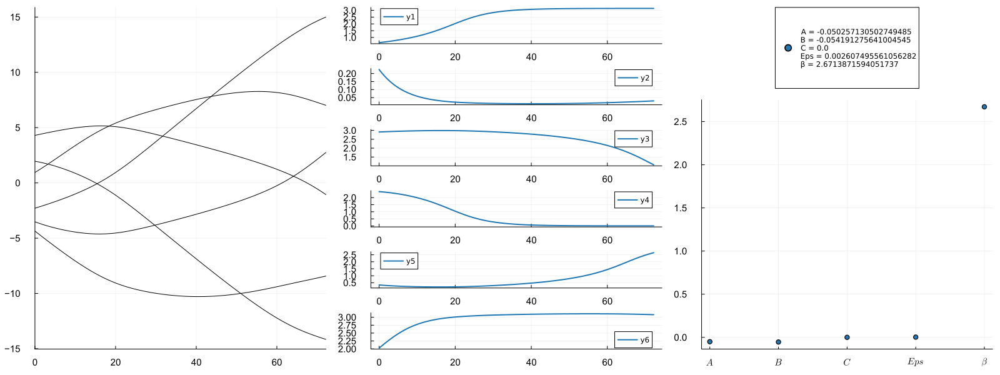

In [115]:
sol = random_sol(Duo_2, gen_P, gen_IC, time_span, cb; alg, kwargs...); Symbol(sol.retcode)

plot(
plot(sol, color = :Black, la = 1, legend = :none),
plot(sol.t, [[Z2Phi.(u) for u in sol[i, :]] for i in 1:6], linewidth = 2, layout = (6, 1)),
scatter([L"A", L"B", L"C", L"Eps", L"β"], sol.prob.p, lab = "A = $(sol.prob.p[1])\n" * "B = $(sol.prob.p[2])\n" * "C = $(sol.prob.p[3])\n" * "Eps = $(sol.prob.p[4])\n" * "β = $(sol.prob.p[5])",legend = (:outertop), legend_column = -1),
layout = (1, 3), size = (1600, 600)
)

---

##### Вспомогательные функции

In [109]:
get_end_state(sol) = sort(round.([Z2Phi.(u) for u in sol[:, end]]; digits = 5))

is_equilibria(x) = all(i -> abs(i) < 1e-3, x)

get_end_state (generic function with 1 method)

#### Рандомная генерация траекторий и их последующий анализ

In [122]:
n_initcond = 100
n_parameters = 1000

sols = Vector{Pair}()

@showprogress "Computing..." for i in 1:n_parameters
    P = gen_P()
    Threads.@threads for j in 1:n_initcond

        prob_julia = ODEProblem(Duo_2, gen_IC(), time_span, P)
        sol = solve(prob_julia, alg; callback = cb, kwargs...)

        if sol.retcode != ReturnCode.Terminated
            end_state = get_end_state(sol)
            if !is_equilibria(Duo_1(end_state, P))
                push!(sols, end_state => deepcopy(sol.prob))
            end
        end
    end
end

sols

Computing... 100%|███████████████████████████████████████| Time: 0:04:15


Pair[]

In [118]:
prob = sols[1][2]
sol = solve(prob, alg; callback = cb, kwargs...)

plot(
plot(sol, color = :Black, la = 1, legend = :none),
plot(sol.t, [[Z2Phi.(u) for u in sol[i, :]] for i in 1:6], linewidth = 2, layout = (6, 1)),
scatter([L"A", L"B", L"C", L"Eps", L"β"], sol.prob.p, lab = "A = $(sol.prob.p[1])\n" * "B = $(sol.prob.p[2])\n" * "C = $(sol.prob.p[3])\n" * "Eps = $(sol.prob.p[4])\n" * "β = $(sol.prob.p[5])",legend = (:outertop), legend_column = -1),
layout = (1, 3), size = (1600, 600)
)

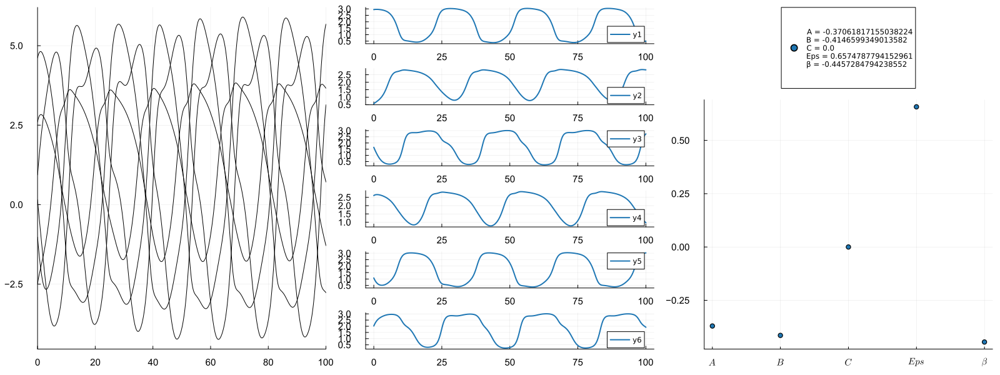

In [120]:
prob2 = remake(prob; tspan = (0.0, 100.0))

sol = solve(prob2, alg; kwargs...)

plot(
plot(sol, color = :Black, la = 1, legend = :none),
plot(sol.t, [[Z2Phi.(u) for u in sol[i, :]] for i in 1:6], linewidth = 2, layout = (6, 1)),
scatter([L"A", L"B", L"C", L"Eps", L"β"], sol.prob.p, lab = "A = $(sol.prob.p[1])\n" * "B = $(sol.prob.p[2])\n" * "C = $(sol.prob.p[3])\n" * "Eps = $(sol.prob.p[4])\n" * "β = $(sol.prob.p[5])",legend = (:outertop), legend_column = -1),
layout = (1, 3), size = (1600, 600)
)

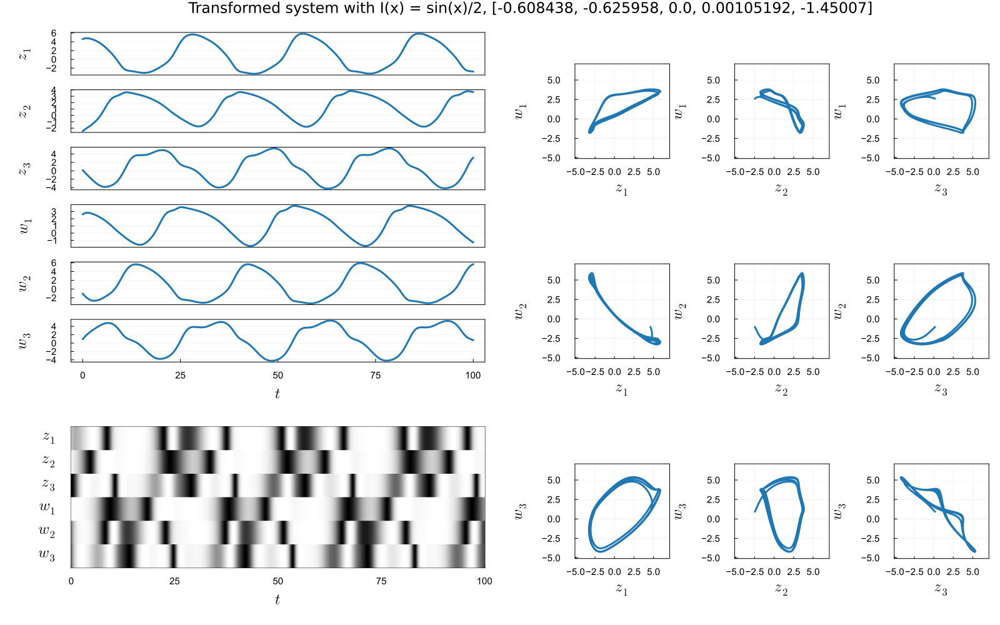

In [121]:
pysol = py_sol{nothing}(sol)

ts = timeseries(pysol, var_labels = var_labels_t, proj_func = proj_func)
p = poincare(pysol, var_pairs, enable_events = false, var_labels = var_labels_t, proj_func = proj_func)
ad = activationdiagram(pysol, var_labels = var_labels_t, thickness_scaling = 2, proj_func = proj_func)#, color_eps = 0.9

bp = plot(ts, ad, p, layout = l, size = (1600, 1000), plot_titlevspan = 0.04, formatter = :plain, plot_title = "Transformed system with I(x) = sin(x)/2, $(repr(P, context=:compact => true))")

---

## Разное

---